# Examples EO datasets of project derived data

This is a notebook showcasing workflow examples for downloading earth observation rater data created within the project. c

### Data download examples in this notebook:


1.  Climate Indicators

3.  Drone imagery

In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np

from eolearn.core import FeatureType, EOPatch
from eolearn.io import SentinelHubEvalscriptTask
from sentinelhub import CRS, Band, BBox, DataCollection, Unit
import numpy as np


### General parameters

In [120]:
# region of interest
europe_bbox = BBox(bbox=[-12.128906,34.885931,40.781250,71.965388], crs=CRS.WGS84)
bbox_kras = BBox(bbox=[13.458595,45.750277,13.779259,45.884751], crs=CRS.WGS84)
bbox_vegetation = BBox(bbox=[10.298653,52.191614,10.427570,52.258176], crs=CRS.WGS84)
bbox_cerknica_lake = BBox(bbox=[14.298878,45.702343,14.477062,45.793621], crs=CRS.WGS84)

# Climate Change Action

## Historical Indicators 

### Land Surface Temperature and Air temperature

### Temperature condition index

### Heat stress index

### Evapotranspiration

## Projection Indicators

### Air temperature, Daily maximum near-surface air temperature, Daily minimum near-surface air temperature

#### Air Temperature Projections 

In [ ]:
band_names = ["tavg_ref_1995_2015", 
              "tavg_ssp_45_proj_2030", 
              "tavg_ssp_45_proj_2050",
              "tavg_ssp_45_proj_2070",
              "tavg_ssp_85_proj_2030",
              "tavg_ssp_85_proj_2050",
              "tavg_ssp_85_proj_2070"
              ]
temperature_indicators_collection = DataCollection.define_byoc(
    "4004f3ee-e5d9-4c2b-a937-de32781b1b91",
    service_url="https://services.sentinel-hub.com",
    bands=[Band(name=name, units=(Unit.DN,), output_types=(np.float32,)) for name in band_names],
)

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

ramp = [
    [-3, 0x0008ff],
    [-1.43, 0x0043ff],
    [0.14, 0x004eff],
    [1.71, 0x0095ff],
    [3.29, 0x00adff],
    [4.86, 0x00f3ff],
    [6.43, 0x00ffff],
    [8.00, 0xccff00],
    [9.57, 0xffeb00],
    [11.14, 0xffbc00],
    [12.71, 0xffa500],
    [14.29, 0xff8100],
    [15.86, 0xff6a00],
    [17.43, 0xff0c00],
    [19, 0xc80000]
]

colormap = LinearSegmentedColormap.from_list("dsd", [f'#{hex(color)[2:].zfill(6)}' for _, color in ramp])

In [ ]:
def create_evalscript(band: str) -> str:
    evalscript = f"""
//VERSION=3
function setup() {{
  return {{
  input: ["{band}", "dataMask"],
  output: [{{ id: "{band}", bands: 1, sampleType: SampleType.FLOAT32 }}, {{ id: "dataMask", bands: 1, sampleType: SampleType.AUTO }} ]
  }};
}}

function evaluatePixel(sample) {{
  return {{ "{band}": [sample.{band}], 
            "dataMask": [sample.dataMask]}};
}}
"""
    return evalscript


In [ ]:
eopatch = EOPatch(bbox=europe_bbox)

In [ ]:
band_name = band_names[0]

for band_name in band_names: 
    print(f"Downloading data for {band_name}...")
    indicator_download_task = SentinelHubEvalscriptTask(
        features=[(FeatureType.DATA, band_name), (FeatureType.MASK, "dataMask")],
        evalscript=create_evalscript(band_name),
        data_collection=temperature_indicators_collection,
        resolution=10000,
        max_threads=3
    )
    eopatch = indicator_download_task.execute(eopatch=eopatch, bbox=europe_bbox, time_interval=["2024-01-01", "2024-01-02"])

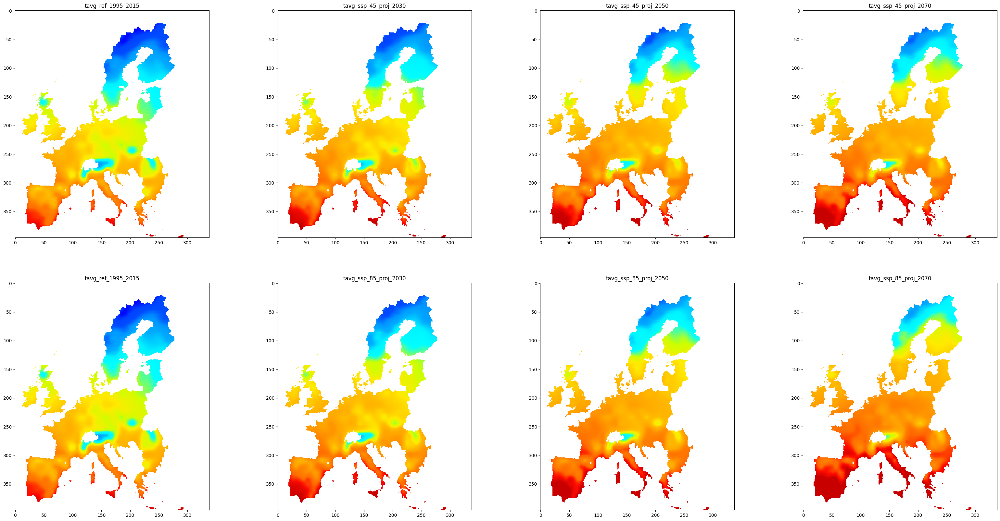

In [ ]:
n = len(band_names)

ncols = 4
nrows = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10*ncols, 10*nrows))


# Plot reference and SSP 4.5 

for i, band_name in enumerate(band_names[:4]): 
    indicator_data = eopatch.data[band_name][0].squeeze()
    indicator_data[eopatch.mask["dataMask"].squeeze() == 0] = np.nan 

    axs[0][i].imshow(indicator_data, cmap=colormap, vmin=-3, vmax=19)
    axs[0][i].set_title(band_name)

# Plot reference and SSP 8.5 
for i, band_name in enumerate([band_names[0]] + band_names[4:]): 
    indicator_data = eopatch.data[band_name][0].squeeze()
    indicator_data[eopatch.mask["dataMask"].squeeze() == 0] = np.nan 

    axs[1][i].imshow(indicator_data, cmap=colormap, vmin=-3, vmax=19)
    axs[1][i].set_title(band_name)

### Evapotranspiration including sublimation and transpiration

### Number of hot days (T > 35°C), Drought frequency and severity

# Environmental Care  

## Historical Indicators

### Land Cover Classification 

### Vegetation Health Index 

### Evapotranspiration

### Normalized difference water index (NDWI)

The NDWI is used to monitor changes related to water content in water bodies. 
As water bodies strongly absorb light in visible to infrared electromagnetic spectrum, NDWI uses green and near infrared bands to highlight water bodies. It is sensitive to built-up land and can result in over-estimation of water bodies.



In [125]:
ndwi_evalscript = """
//VERSION=3
//ndwi
const colorRamp1 = [
  	[0, 0xFFFFFF],
  	[1, 0x008000]
  ];
const colorRamp2 = [
  	[0, 0xFFFFFF],
  	[1, 0x0000CC]
  ];

let viz1 = new ColorRampVisualizer(colorRamp1);
let viz2 = new ColorRampVisualizer(colorRamp2);

function setup() {
  return {
    input: ["Green", "NIR_Narrow", "dataMask"],
    output: [
		{ id:"default", bands: 4 },
        { id: "index", bands: 1, sampleType: "FLOAT32" }
	]
  };
}

function evaluatePixel(samples) {
  let val = index(samples.Green, samples.NIR_Narrow);
  let imgVals = null;
  const indexVal = samples.dataMask === 1 ? val : NaN;
  
  if (val < -0) {
    imgVals = [...viz1.process(-val), samples.dataMask];
  } else {
    imgVals = [...viz2.process(Math.sqrt(Math.sqrt(val))), samples.dataMask];
  }
  return {
    default: imgVals,
    index: [indexVal]
  };
}
"""

In [144]:

indicator_download_task = SentinelHubEvalscriptTask(
features=[(FeatureType.DATA, "default"), (FeatureType.DATA, "index")],
evalscript=ndwi_evalscript,
data_collection=DataCollection.HARMONIZED_LANDSAT_SENTINEL,
resolution=10,
maxcc=0.85,
max_threads=3
)
eopatch = indicator_download_task.execute(bbox=bbox_cerknica_lake, time_interval=["2023-05-30", "2023-06-30"])

In [145]:
eopatch

EOPatch(
  bbox=BBox(((14.298878, 45.702343), (14.477062, 45.793621)), crs=CRS('4326'))
  timestamps=[2023-05-30 10:08:10.618000, ...]<length=11>
  data={
    default: numpy.ndarray(shape=(11, 1004, 1394, 4), dtype=uint8)
    index: numpy.ndarray(shape=(11, 1004, 1394, 1), dtype=float32)
  }
)

Text(0.5, 1.0, '2023-06-30 09:45:36.194000')

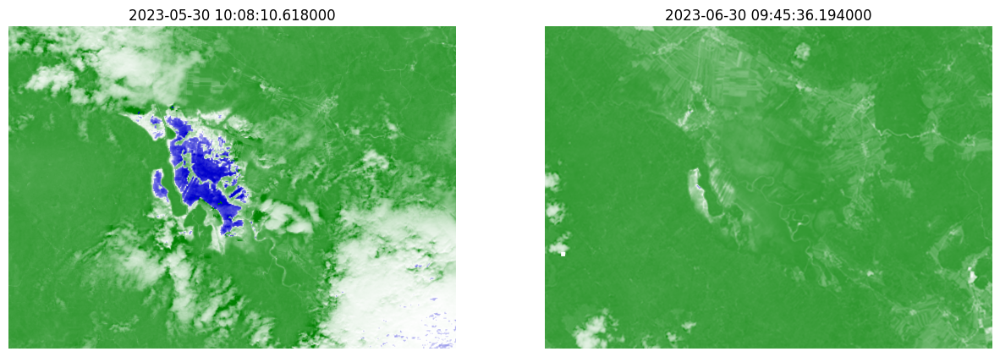

In [154]:
fig, ax = plt.subplots(ncols=2, figsize=(15, 15))
ax[0].imshow(eopatch.data["default"][0].squeeze())
ax[0].set_title(eopatch.timestamps[0])
ax[0].axis("off")
ax[1].imshow(eopatch.data["default"][-1].squeeze())
ax[1].axis("off")
ax[1].set_title(eopatch.timestamps[-1])



### Normalized Burn Ratio

Showcasing the NBR index over an area in Slovenia where a wildfire occured in 2022. 

In [117]:
nbr_evalscript = """
//VERSION=3

let viz = ColorGradientVisualizer.createRedTemperature(-0.89, 0.89);

function setup() {
  return {
    input: [
      {
        bands: ["B03", "B04", "B08", "B12", "dataMask"],
      },
    ],
    output: [
      { id: "default", bands: 4 },
      { id: "index", bands: 1, sampleType: "FLOAT32" },
      { id: "eobrowserStats", bands: 2, sampleType: "FLOAT32" },
      { id: "dataMask", bands: 1 },
    ],
  };
}

function evaluatePixel(samples) {
  let val = index(samples.B08, samples.B12);
  let imgVals = null;
  // The library for tiffs works well only if there is only one channel returned.
  // So we encode the "no data" as NaN here and ignore NaNs on frontend.
  const indexVal = samples.dataMask === 1 ? val : NaN;
  imgVals = [...viz.process(val), samples.dataMask];
  return {
    default: imgVals,
    index: [indexVal],
    eobrowserStats: [val, isCloud(samples) ? 1 : 0],
    dataMask: [samples.dataMask],
  };
}

function isCloud(samples) {
  const NGDR = index(samples.B03, samples.B04);
  const bRatio = (samples.B03 - 0.175) / (0.39 - 0.175);
  return bRatio > 1 || (bRatio > 0 && NGDR > 0);
}
"""

In [ ]:

indicator_download_task = SentinelHubEvalscriptTask(
features=[(FeatureType.DATA, "default"), (FeatureType.DATA, "index"), (FeatureType.MASK, "dataMask")],
evalscript=nbr_evalscript,
data_collection=DataCollection.SENTINEL2_L2A,
resolution=20,
max_threads=3
)
eopatch = indicator_download_task.execute(bbox=bbox_kras, time_interval=["2022-07-17", "2022-07-24"])

In [ ]:
complete_observations_mask = (np.sum(~eopatch.mask["dataMask"], axis=(1, 2)) == 0).squeeze()

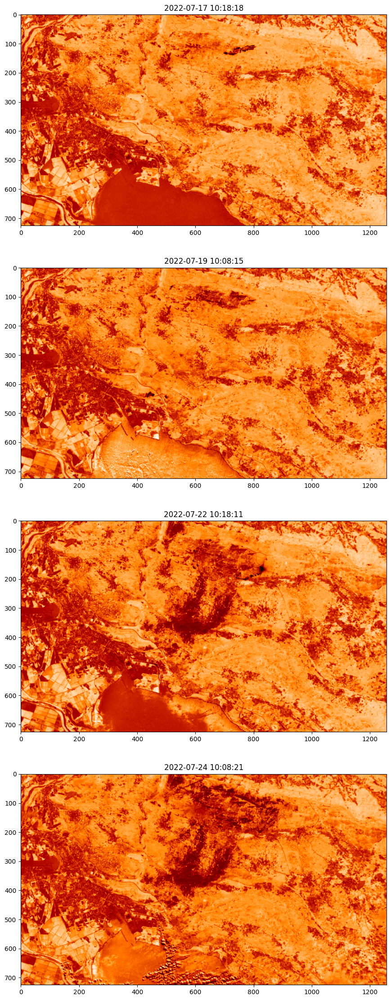

In [ ]:
n = complete_observations_mask.sum()
valid_timestamps = np.array(eopatch.timestamps)[complete_observations_mask]
fig, axs = plt.subplots(nrows=n, figsize=(15, 7*n))
for ax, idx, ts in zip(axs.flatten(), eopatch.data["default"][complete_observations_mask], valid_timestamps):
    ax.imshow(idx[..., [0, 1, 2]])
    ax.set_title(ts)

## Projection Indicators

### Capacity of soil to store water

### Moisture in upper portion of soil column

### Near-surface relative humidity

### Precipitation

### Snowfall flux

# To Preserve Landscapes and Biodiversity

## Historical Indicators

### Vegetation health index

The vegetation condition index [1] compares the NDVI at current (observed) time to historical values, i.e. to NDVI at similar dates in previous years:

VCI = (NDVI_observed - NDVI_hist_min) / (NDVI_hist_max - NDVI_hist_min)



In [68]:
fcover_evalscript = """
//VERSION=3


function setup() {
  return {
    input: [{
      bands: [
        "B03",
        "B04",
        "B05",
        "B06",
        "B07",
        "B8A",
        "B11",
        "B12",
        "viewZenithMean",
        "viewAzimuthMean",
        "sunZenithAngles",
        "sunAzimuthAngles"
      ]
    }],
    output: [
        {
          id: "default",
          sampleType: "AUTO",
          bands: 1
        }
    ]
  }
}

var degToRad = Math.PI / 180;

function evaluatePixel(sample) {
  var b03_norm = normalize(sample.B03, 0, 0.253061520472);
  var b04_norm = normalize(sample.B04, 0, 0.290393577911);
  var b05_norm = normalize(sample.B05, 0, 0.305398915249);
  var b06_norm = normalize(sample.B06, 0.00663797254225, 0.608900395798);
  var b07_norm = normalize(sample.B07, 0.0139727270189, 0.753827384323);
  var b8a_norm = normalize(sample.B8A, 0.0266901380821, 0.782011770669);
  var b11_norm = normalize(sample.B11, 0.0163880741923, 0.493761397883);
  var b12_norm = normalize(sample.B12, 0, 0.49302598446);
  var viewZen_norm = normalize(Math.cos(sample.viewZenithMean * degToRad), 0.918595400582, 0.999999999991);
  var sunZen_norm  = normalize(Math.cos(sample.sunZenithAngles * degToRad), 0.342022871159, 0.936206429175);
  var relAzim_norm = Math.cos((sample.sunAzimuthAngles - sample.viewAzimuthMean) * degToRad)

  var n1 = neuron1(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm);
  var n2 = neuron2(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm);
  var n3 = neuron3(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm);
  var n4 = neuron4(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm);
  var n5 = neuron5(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm);

  var l2 = layer2(n1, n2, n3, n4, n5);

  var fcover = denormalize(l2, 0.000181230723879, 0.999638214715);

  return {default: [fcover]}
}

function neuron1(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm) {
  var sum =
	- 1.45261652206
	- 0.156854264841 * b03_norm
	+ 0.124234528462 * b04_norm
	+ 0.235625516229 * b05_norm
	- 1.8323910258 * b06_norm
	- 0.217188969888 * b07_norm
	+ 5.06933958064 * b8a_norm
	- 0.887578008155 * b11_norm
	- 1.0808468167 * b12_norm
	- 0.0323167041864 * viewZen_norm
	- 0.224476137359 * sunZen_norm
	- 0.195523962947 * relAzim_norm;

  return tansig(sum);
}

function neuron2(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm) {
  var sum =
	- 1.70417477557
	- 0.220824927842 * b03_norm
	+ 1.28595395487 * b04_norm
	+ 0.703139486363 * b05_norm
	- 1.34481216665 * b06_norm
	- 1.96881267559 * b07_norm
	- 1.45444681639 * b8a_norm
	+ 1.02737560043 * b11_norm
	- 0.12494641532 * b12_norm
	+ 0.0802762437265 * viewZen_norm
	- 0.198705918577 * sunZen_norm
	+ 0.108527100527 * relAzim_norm;

  return tansig(sum);
}

function neuron3(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm) {
  var sum =
	+ 1.02168965849
	- 0.409688743281 * b03_norm
	+ 1.08858884766 * b04_norm
	+ 0.36284522554 * b05_norm
	+ 0.0369390509705 * b06_norm
	- 0.348012590003 * b07_norm
	- 2.0035261881 * b8a_norm
	+ 0.0410357601757 * b11_norm
	+ 1.22373853174 * b12_norm
	+ -0.0124082778287 * viewZen_norm
	- 0.282223364524 * sunZen_norm
	+ 0.0994993117557 * relAzim_norm;

  return tansig(sum);
}

function neuron4(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm) {
  var sum =
	- 0.498002810205
	- 0.188970957866 * b03_norm
	- 0.0358621840833 * b04_norm
	+ 0.00551248528107 * b05_norm
	+ 1.35391570802 * b06_norm
	- 0.739689896116 * b07_norm
	- 2.21719530107 * b8a_norm
	+ 0.313216124198 * b11_norm
	+ 1.5020168915 * b12_norm
	+ 1.21530490195 * viewZen_norm
	- 0.421938358618 * sunZen_norm
	+ 1.48852484547 * relAzim_norm;

  return tansig(sum);
}

function neuron5(b03_norm,b04_norm,b05_norm,b06_norm,b07_norm,b8a_norm,b11_norm,b12_norm, viewZen_norm,sunZen_norm,relAzim_norm) {
  var sum =
	- 3.88922154789
	+ 2.49293993709 * b03_norm
	- 4.40511331388 * b04_norm
	- 1.91062012624 * b05_norm
	- 0.703174115575 * b06_norm
	- 0.215104721138 * b07_norm
	- 0.972151494818 * b8a_norm
	- 0.930752241278 * b11_norm
	+ 1.2143441876 * b12_norm
	- 0.521665460192 * viewZen_norm
	- 0.445755955598 * sunZen_norm
	+ 0.344111873777 * relAzim_norm;

  return tansig(sum);
}

function layer2(neuron1, neuron2, neuron3, neuron4, neuron5) {
  var sum =
	- 0.0967998147811
	+ 0.23080586765 * neuron1
	- 0.333655484884 * neuron2
	- 0.499418292325 * neuron3
	+ 0.0472484396749 * neuron4
	- 0.0798516540739 * neuron5;

  return sum;
}

function normalize(unnormalized, min, max) {
  return 2 * (unnormalized - min) / (max - min) - 1;
}
function denormalize(normalized, min, max) {
  return 0.5 * (normalized + 1) * (max - min) + min;
}
function tansig(input) {
  return 2 / (1 + Math.exp(-2 * input)) - 1;
}
"""

In [112]:

indicator_download_task = SentinelHubEvalscriptTask(
features=[(FeatureType.DATA, "default")],
evalscript=fcover_evalscript,
data_collection=DataCollection.SENTINEL2_L2A,
resolution=10,
max_threads=3
)
eopatch = indicator_download_task.execute(bbox=bbox_vegetation, time_interval=["2022-05-01", "2022-05-14"])

In [113]:
eopatch.data["default"].max()

254

Text(0.5, 1.0, 'FCover')

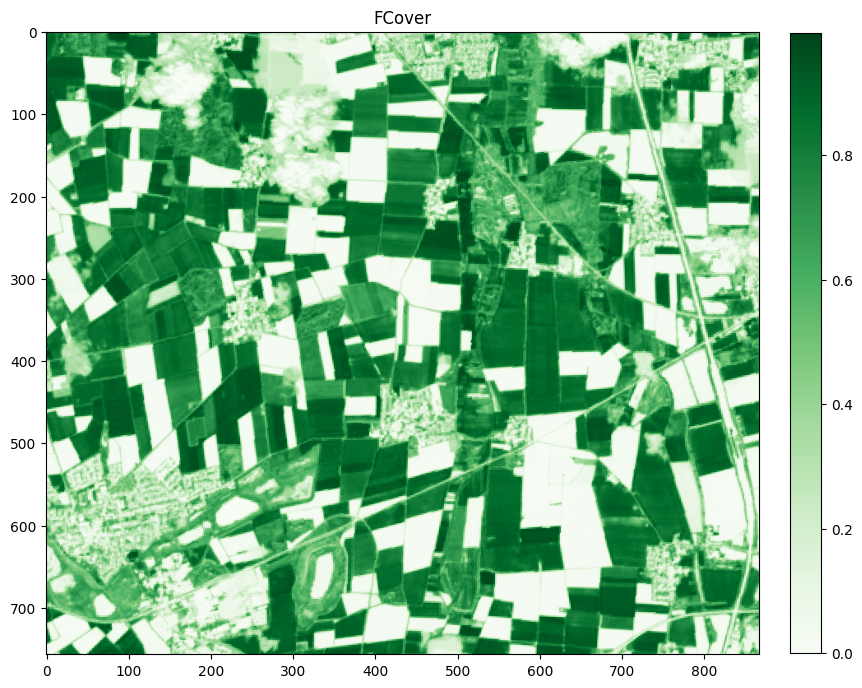

In [116]:
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(eopatch.data["default"][5].squeeze() / 255, cmap="Greens")
cbar = plt.colorbar(im, ax=ax, fraction=0.04, pad=0.04)
ax.set_title("FCover")


### Normalized Burn Ratio

Showcasing the NBR index over an area in Slovenia where a wildfire occured in 2022. 

In [8]:
nbr_evalscript = """
//VERSION=3

let viz = ColorGradientVisualizer.createRedTemperature(-0.89, 0.89);

function setup() {
  return {
    input: [
      {
        bands: ["B03", "B04", "B08", "B12", "dataMask"],
      },
    ],
    output: [
      { id: "default", bands: 4 },
      { id: "index", bands: 1, sampleType: "FLOAT32" },
      { id: "eobrowserStats", bands: 2, sampleType: "FLOAT32" },
      { id: "dataMask", bands: 1 },
    ],
  };
}

function evaluatePixel(samples) {
  let val = index(samples.B08, samples.B12);
  let imgVals = null;
  // The library for tiffs works well only if there is only one channel returned.
  // So we encode the "no data" as NaN here and ignore NaNs on frontend.
  const indexVal = samples.dataMask === 1 ? val : NaN;
  imgVals = [...viz.process(val), samples.dataMask];
  return {
    default: imgVals,
    index: [indexVal],
    eobrowserStats: [val, isCloud(samples) ? 1 : 0],
    dataMask: [samples.dataMask],
  };
}

function isCloud(samples) {
  const NGDR = index(samples.B03, samples.B04);
  const bRatio = (samples.B03 - 0.175) / (0.39 - 0.175);
  return bRatio > 1 || (bRatio > 0 && NGDR > 0);
}
"""

In [21]:

indicator_download_task = SentinelHubEvalscriptTask(
features=[(FeatureType.DATA, "default"), (FeatureType.DATA, "index"), (FeatureType.MASK, "dataMask")],
evalscript=nbr_evalscript,
data_collection=DataCollection.SENTINEL2_L2A,
resolution=20,
max_threads=3
)
eopatch = indicator_download_task.execute(bbox=bbox_kras, time_interval=["2022-07-17", "2022-07-24"])

In [31]:
complete_observations_mask = (np.sum(~eopatch.mask["dataMask"], axis=(1, 2)) == 0).squeeze()

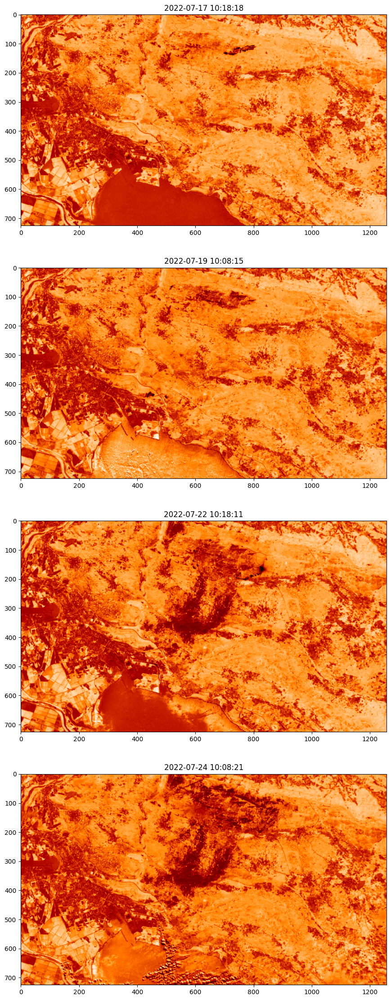

In [43]:
n = complete_observations_mask.sum()
valid_timestamps = np.array(eopatch.timestamps)[complete_observations_mask]
fig, axs = plt.subplots(nrows=n, figsize=(15, 7*n))
for ax, idx, ts in zip(axs.flatten(), eopatch.data["default"][complete_observations_mask], valid_timestamps):
    ax.imshow(idx[..., [0, 1, 2]])
    ax.set_title(ts)

# To Ensure a Fair Income for Farmers

## Historical Indicators

### Heat stress index

## Projection Indicators

### Number of hot days (T > 35°C), Drought frequency and severity